# 2D Heat Diffusion on a Flower

_Author: Jordan Saethre_

_Date: March 2020_

This project was done as part of the course work for a course in Numerical Methods. The heat equation is solved using Fast Fourier Transforms with initial condition the area parameterized by a flower. 

In [8]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from IPython.display import HTML
HTML('''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
To toggle on/off output_stderr, click <a href="javascript:code_toggle_err()">here</a>.''')

import scipy as sp
import numpy as np
import time
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import matplotlib.pyplot as plt

import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation

### Parameters

In [3]:
a = -np.pi
b = np.pi
n = 256
tau = 0.01
k = np.linspace(-n/2,n/2+1, n)
x = np.linspace(a,b,n+1)
y = np.linspace(a,b,n+1)
iterates1 = 2
iterates2 = 10

### Initial Condition

In [4]:
x_theta = lambda theta: (np.pi/2 + (np.pi/5)*np.sin(6*theta))*np.cos(theta)
y_theta = lambda theta: (np.pi/2 + (np.pi/5)*np.sin(6*theta))*np.sin(theta)

def initial_mat(x_theta,y_theta,n, x):
    initial=np.zeros(shape=(n,n))
    for i in range(0,len(x)-1):
        for j in range(0,len(x)-1):
            ri=np.sqrt(x[i]**2 +x[j]**2)
            r=np.sqrt(x_theta(np.arccos(x[i]/ri))**2 + y_theta(np.arccos(x[i]/ri))**2)
            if abs(ri)>abs(r):
                initial[i,j]=0
            else:
                initial[i,j]=1
    return(initial)

In [22]:
ui = initial_mat(x_theta,y_theta,n,x)

C:\Users\saeth\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

invalid value encountered in double_scalars



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


### Solve with Fast Fourier Transforms

In [16]:
def fourier_solve(u,k,tau):
    ker = np.fft.fftshift(np.exp(-k**2*tau))
    for i in range(0, len(x)-1):
        u[i] = np.fft.ifft(np.fft.fft(u[i])*ker)
        u = np.transpose(u)
    for j in range(0,len(y)-1):
        u[j] = np.fft.ifft(np.fft.fft(u[j])*ker)
        return u

In [15]:
def fourier_iterate(x_theta,y_theta,n,x,k,iterates):
    u = initial_mat(x_theta,y_theta,n,x)
    for i in range(0, iterates):
        u_next = fourier_solve(u,k,tau)
        u = u_next
    return u

### Create MP4 File

In [23]:
def data_gen(framenumber, Z ,surf):
    global u
    global ui
    global k
    global tau
    fourier_solve(ui,k,tau)
    ui[:] = u[:]
    Z = ui
    ax.clear()
    plotset()
    surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=cm.viridis,linewidth=0, antialiased=False, alpha=0.7)
    return surf,

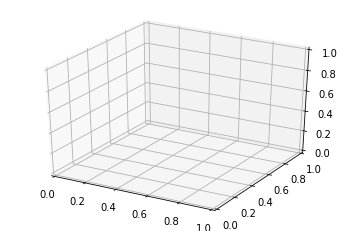

In [28]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

X = np.arange(np.pi,np.pi,(b-a)/n)
Y = np.arange(np.pi,np.pi,(b-a)/n)
X,Y= np.meshgrid(X,Y)

Z = ui 

In [24]:
def plotset():
    ax.set_xlim3d(-np.pi, np.pi)
    ax.set_ylim3d(-np.pi, np.pi)
    ax.set_zlim3d(-np.pi, np.pi)
    ax.set_autoscalez_on(False)
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    cset = ax.contour(X, Y, Z, zdir='x', offset=0. , cmap=cm.viridis)
    cset = ax.contour(X, Y, Z, zdir='y', offset=1. , cmap=cm.viridis)
    cset = ax.contour(X, Y, Z, zdir='z', offset=-1., cmap=cm.viridis)

In [25]:
plotset()
surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=cm.viridis,linewidth=0, antialiased=False, alpha=0.7)


fig.colorbar(surf, shrink=0.5, aspect=5)

ani = animation.FuncAnimation(fig, data_gen, fargs=(Z, surf),frames=1000, interval=30, blit=False)
ani.save("2dDiffusion_flower.mp4", bitrate=1024)

plt.show() 

TypeError: Shape of y does not match that of z: found (256, 256) instead of (41, 41).

### Plots

In [6]:
def plot_surface(solution):
	surface_df = pd.DataFrame(solution)
	surface_df.to_csv('surface_data.csv', index = False)
	surface_data = pd.read_csv('surface_data.csv')
	fig = go.Figure(data=[go.Surface(z=surface_data.values, colorscale='Viridis')])
	fig.update_traces(contours_z=dict(show=True, usecolormap=True, highlightcolor="limegreen", project_z=True))
	fig.update_layout(title='Solution', autosize=False, width=500, height=500,margin=dict(l=65, r=50, b=65, t=90), xaxis = dict(visible = False))
	fig.show()

plot_surface(initial_mat(x_theta,y_theta,n,x))
plot_surface(fourier_iterate(x_theta,y_theta,n,x,k,iterates1))
plot_surface(fourier_iterate(x_theta,y_theta,n,x,k,iterates2))

C:\Users\saeth\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

invalid value encountered in double_scalars



C:\Users\saeth\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\Users\saeth\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: ComplexWarning:

Casting complex values to real discards the imaginary part

